In [1]:
import librosa
import matplotlib.pyplot as plt
import numpy as np
import mpld3
from utils.code_exercise1 import my_window, get_fundamental_freq
from utils.code_exercise3 import get_a_vector
from scipy.signal import get_window, freqz, lfilter
mpld3.enable_notebook()

/Users/christoper/.pyenv/versions/3.7.6/lib/python3.7/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit
/Users/christoper/.pyenv/versions/3.7.6/lib/python3.7/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import of 'jit' requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit


# Speech 1

In [2]:
y1, sr1 = librosa.core.load("audio_files/exercise1/speech1.wav", sr=None)
y2, sr2 = librosa.core.load('audio_files/exercise1/speech2.wav', sr=None)

In [3]:
frame_length = 32
n_length = int(sr1 * frame_length / 1000) 
hann_win = get_window('hann', n_length)

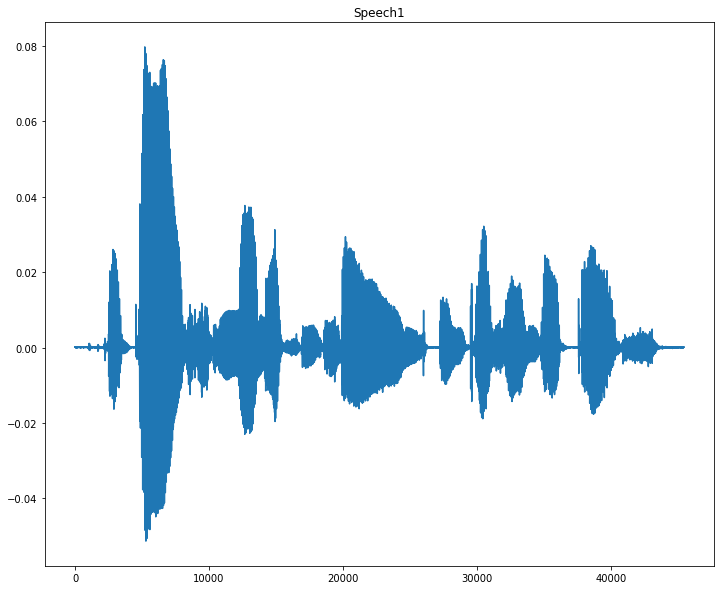

In [4]:
plt.figure(figsize=(12,10))
plt.title("Speech1")
plt.plot(y1)

In [5]:
Time1 = np.linspace(0, len(y1) / sr1, num=len(y1))
Time2 = np.linspace(0, len(y2) / sr2, num=len(y2))

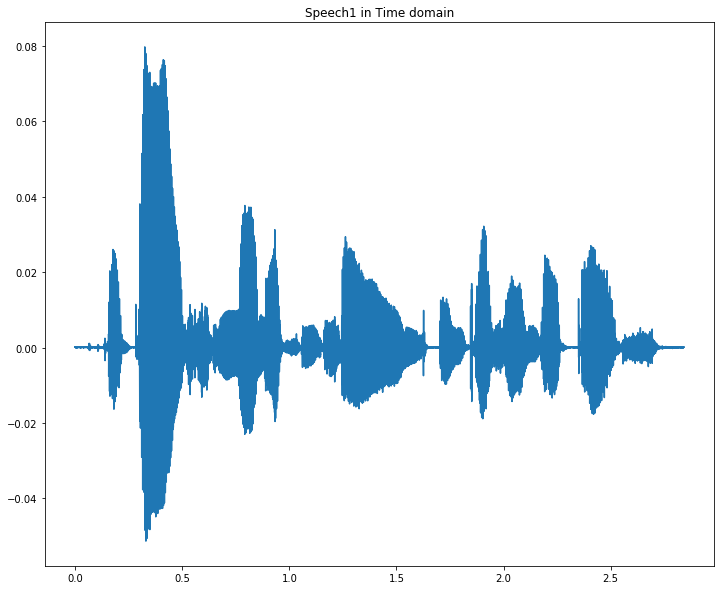

In [6]:
plt.figure(figsize=(12,10))
plt.title("Speech1 in Time domain")
plt.plot(Time1, y1)

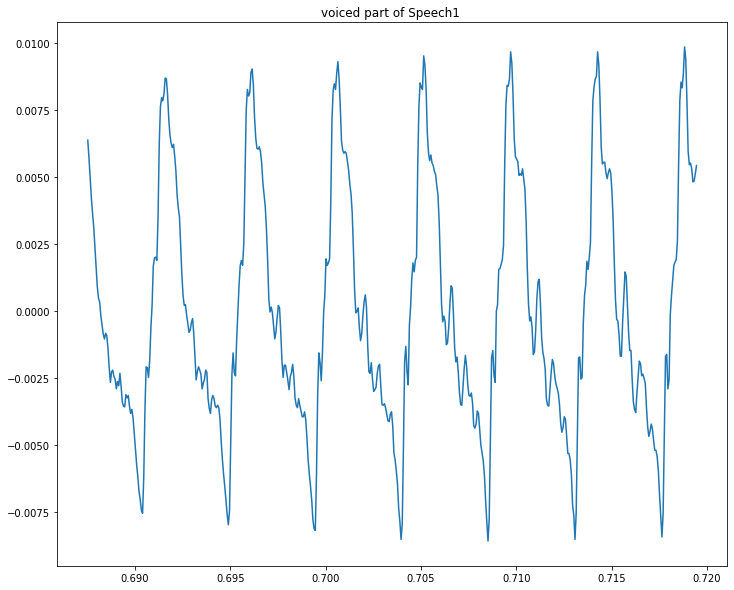

In [7]:
y_voiced = y1[11000:11000+n_length]
t_voiced = Time1[11000:11000+n_length]
plt.figure(figsize=(12,10))
plt.title("voiced part of Speech1 ")
plt.plot(t_voiced, y_voiced)

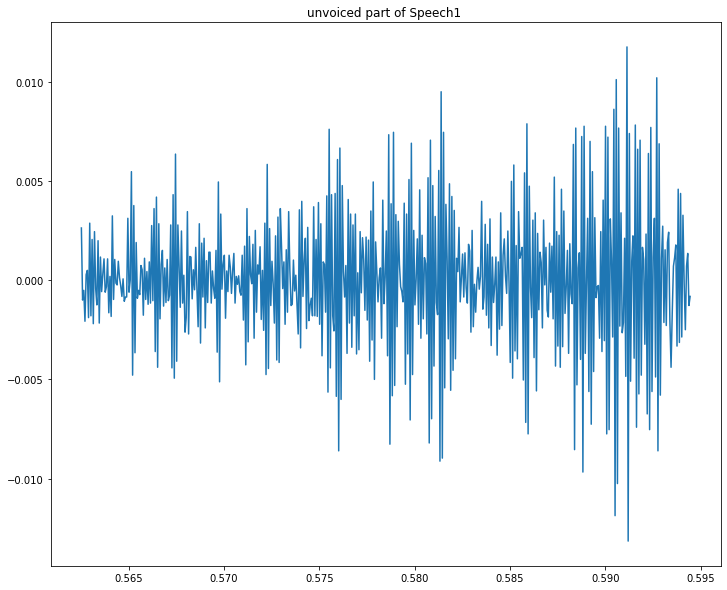

In [8]:
y_unvoiced = y1[9000:9000+n_length]
t_unvoiced = Time1[9000:9000+n_length]
plt.figure(figsize=(12,10))
plt.title("unvoiced part of Speech1 ")
plt.plot(t_unvoiced, y_unvoiced)

In [10]:
y_voiced.shape

(512,)

In [11]:
seg_voiced = y_voiced * hann_win
seg_unvoiced = y_unvoiced * hann_win

In [12]:
def plot_amplitude(freq, resp):
    plt.plot(freq, np.abs(resp))
    plt.ylabel("Amplitude")
    plt.xlabel("Hz")
    plt.show()

In [13]:
def plot_phase(freq, resp):
    plt.plot(freq, np.angle(resp, deg=True))
    plt.ylabel("degrees")
    plt.xlabel("Hz")
    plt.show()

## Part 4

In [14]:
a = get_a_vector(seg_voiced)
freq, resp_voiced = freqz(1, np.concatenate(([1], a)), n_length, whole=True, fs=sr1)

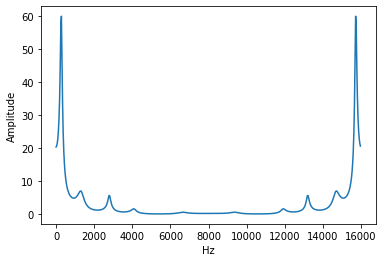

In [15]:
plot_amplitude(freq, resp_voiced)

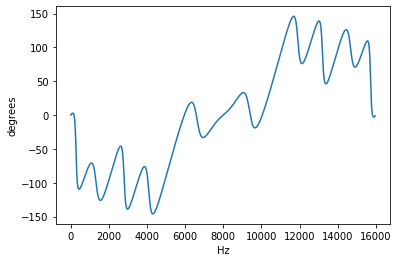

In [16]:
plot_phase(freq, resp_voiced)

## Part 5

In [17]:
S = np.fft.rfft(seg_voiced)

In [18]:
# make the resp_voiced equal in length
resp_voiced = resp_voiced[:S.shape[0]]
freq = freq[:S.shape[0]]

In [19]:
S_db = 10* np.log10(np.abs(S))
y_db = 10 * np.log10(np.abs(resp_voiced))

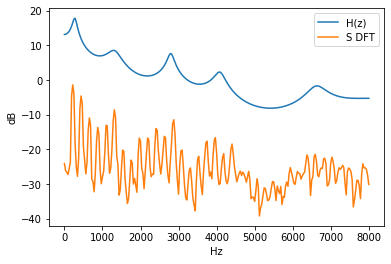

In [20]:
plt.plot(freq[:S_db.shape[0]], y_db, label="H(z)")
plt.plot(freq[:S_db.shape[0]], S_db, label="S DFT")
plt.ylabel("dB")
plt.xlabel("Hz")
plt.legend()

## Unvoiced

In [21]:
a_unvoiced = get_a_vector(seg_unvoiced)
_, resp_unvoiced = freqz(1, np.concatenate(([1], a_unvoiced)), n_length, whole=True, fs=sr2)

In [22]:
S_unvoiced = np.fft.rfft(seg_unvoiced)

In [23]:
# make the resp_voiced equal in length
resp_unvoiced = resp_unvoiced[:S.shape[0]]

In [24]:
S_unvoiced_db = 10* np.log10(np.abs(S_unvoiced))
y_unvoiced_db = 10 * np.log10(np.abs(resp_unvoiced))

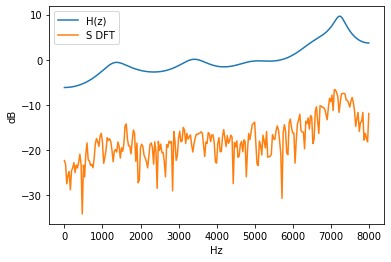

In [25]:
plt.plot(freq, y_unvoiced_db, label="H(z)")
plt.plot(freq, S_unvoiced_db, label="S DFT")
plt.ylabel("dB")
plt.xlabel("Hz")
plt.legend()

## Part 6

In [26]:
e_voiced = lfilter(np.concatenate(([1], a)), 1, seg_voiced)

In [27]:
n_index = np.arange(n_length)

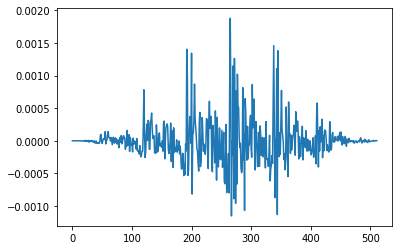

In [28]:
plt.plot(n_index, e_voiced)

## Unvoiced

In [29]:
e_unvoiced = lfilter(np.concatenate(([1], a_unvoiced)), 1, seg_unvoiced)

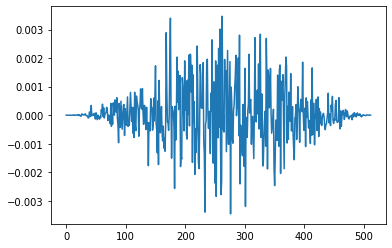

In [30]:
plt.plot(n_index, e_unvoiced)

## Part 7

In [31]:
def get_b0(resp): # to adjust Hz
    energy = np.power(resp, 2).sum()
    b0 = np.sqrt(energy)
    return b0

In [32]:
b0 = get_b0(e_voiced)
estimated_signal = 10* np.log10(b0 * resp_voiced)

/Users/christoper/.pyenv/versions/3.7.6/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


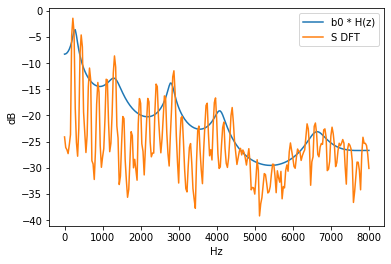

In [33]:
plt.plot(freq[:S_db.shape[0]], estimated_signal[:S_db.shape[0]], label="b0 * H(z)")
plt.plot(freq[:S_db.shape[0]], S_db, label="S DFT")
plt.ylabel("dB")
plt.xlabel("Hz")
plt.legend()

## Part 8

/Users/christoper/.pyenv/versions/3.7.6/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/christoper/.pyenv/versions/3.7.6/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/christoper/.pyenv/versions/3.7.6/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/christoper/.pyenv/versions/3.7.6/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/christoper/.pyenv/versions/3.7.6/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting c

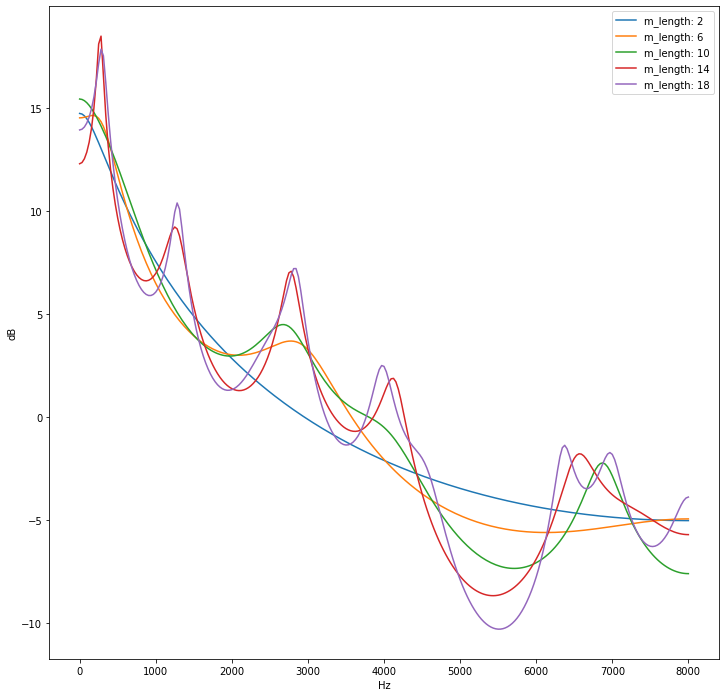

In [34]:
plt.figure(figsize=(12,12))
for m_length in range(2,21,4):
    a = get_a_vector(seg_voiced, m_length)
    _, resp = freqz(1, np.concatenate(([1], a)), n_length, whole=True, fs=sr1)
    # b0 = get_b0(resp)
    estimated_signal_db = 10* np.log10(resp)
    plt.plot(freq, estimated_signal_db[:freq.shape[0]], label="m_length: {}".format(m_length))


plt.ylabel("dB")
plt.xlabel("Hz")
plt.legend()

too few m_length, not enough formants to model. too many, it tries to model the signal itself

## Part 9

In [35]:
e_voiced_emp = lfilter(np.concatenate(([1], a)), 0.95, seg_voiced)

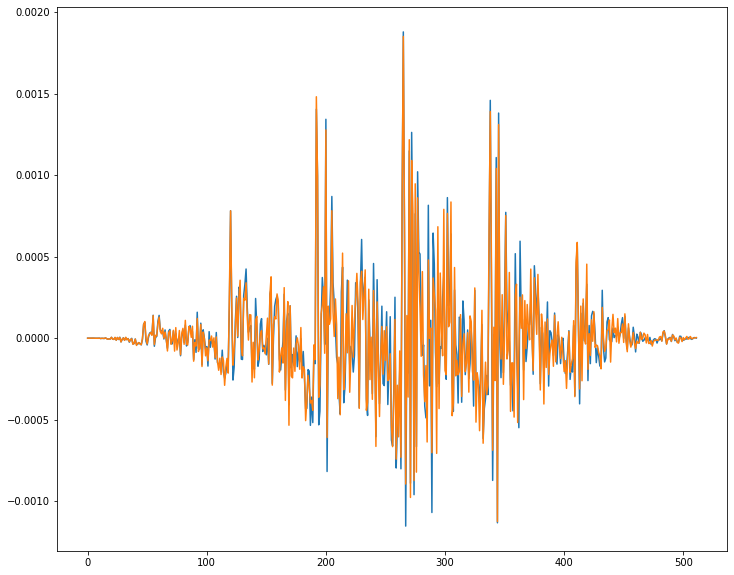

In [36]:
plt.figure(figsize=(12,10))
plt.plot(n_index, e_voiced, label="without preemp")
plt.plot(n_index, e_voiced_emp, label="emp 0.95")

In [37]:
e_voiced.sum()

-0.00020443167091880438

In [38]:
e_voiced_emp.sum()

-0.0001764643388192707